# COVID 19 analysis

## Intro

How to install the required tools to run this?
Well, you should follow the intructions.

It would not have been possible to run this if you didn't have the notebook, but again, the instructions are in the README.md.

In [1]:
import pandas as pd
import numpy as np

In [2]:
# set the seed
np.random.seed(1)

In [3]:
import plotly.express as px
import plotly.graph_objects as go

In [4]:
import matplotlib.pyplot as plt

In [5]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [12.0, 6.0]
plt.rcParams['figure.dpi'] = 80

import seaborn as sns

#sns.set_context("paper")
sns.set_context("notebook")
plt.style.use('seaborn-darkgrid')

In [6]:
#COVID-19/archived_data/archived_time_series
confirmed_df = pd.read_csv('./COVID-19/archived_data/archived_time_series/time_series_19-covid-Confirmed_archived_0325.csv')
deaths_df = pd.read_csv('./COVID-19/archived_data/archived_time_series/time_series_19-covid-Deaths_archived_0325.csv')
recovered_df = pd.read_csv('./COVID-19/archived_data/archived_time_series/time_series_19-covid-Recovered_archived_0325.csv')

In [7]:
# Melt data with dates into rows
confirmed_data_df = confirmed_df.melt(id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'], var_name="Date", value_name="Confirmed")
death_data_df = deaths_df.melt(id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'], var_name="Date", value_name="Deaths")
recovered_data_df = recovered_df.melt(id_vars=['Province/State', 'Country/Region', 'Lat', 'Long'], var_name="Date",  value_name="Recovered")

In [8]:
confirmed_data_df

,Province/State,Country/Region,Lat,Long,Date,Confirmed
0,NaN,Thailand,15.0000,101.0000,1/22/20,2.0
1,NaN,Japan,36.0000,138.0000,1/22/20,2.0
2,NaN,Singapore,1.2833,103.8333,1/22/20,0.0
3,NaN,Nepal,28.1667,84.2500,1/22/20,0.0
4,NaN,Malaysia,2.5000,112.5000,1/22/20,0.0
...,...,...,...,...,...,...
31057,NaN,Jersey,49.1900,-2.1100,3/23/20,0.0
31058,NaN,Puerto Rico,18.2000,-66.5000,3/23/20,0.0
31059,NaN,Republic of the Congo,-1.4400,15.5560,3/23/20,0.0
31060,NaN,The Bahamas,24.2500,-76.0000,3/23/20,0.0


In [9]:
all_data_df = pd.concat([confirmed_data_df, death_data_df['Deaths'] , recovered_data_df['Recovered']], axis=1).reset_index().drop(['index'], axis=1)

In [10]:
# Add zero where we have no data
all_data_df[["Deaths", "Recovered", "Confirmed"]] = all_data_df[["Deaths", "Recovered", "Confirmed"]].apply(lambda row: row.fillna(0))

In [11]:
# Changing Date column into an actual date type
all_data_df.loc[:, "Date"] = all_data_df["Date"].apply(lambda s: pd.to_datetime(s).date())

In [12]:
latest_date = all_data_df["Date"].max()

In [13]:
confirmed_data_df.dropna(subset=["Province/State"])

,Province/State,Country/Region,Lat,Long,Date,Confirmed
5,British Columbia,Canada,49.2827,-123.1207,1/22/20,0.0
6,New South Wales,Australia,-33.8688,151.2093,1/22/20,0.0
7,Victoria,Australia,-37.8136,144.9631,1/22/20,0.0
8,Queensland,Australia,-28.0167,153.4000,1/22/20,0.0
19,South Australia,Australia,-34.9285,138.6007,1/22/20,0.0
...,...,...,...,...,...,...
31033,Sint Maarten,Netherlands,18.0425,-63.0548,3/23/20,1.0
31036,Isle of Man,United Kingdom,54.2361,-4.5481,3/23/20,5.0
31038,Northwest Territories,Canada,64.8255,-124.8457,3/23/20,1.0
31052,United States Virgin Islands,US,18.3358,-64.8963,3/23/20,6.0


In [14]:
confirmed_df["Country/Region"].unique()

array(['Thailand', 'Japan', 'Singapore', 'Nepal', 'Malaysia', 'Canada',
       'Australia', 'Cambodia', 'Sri Lanka', 'Germany', 'Finland',
       'United Arab Emirates', 'Philippines', 'India', 'Italy', 'Sweden',
       'Spain', 'Belgium', 'Egypt', 'Lebanon', 'Iraq', 'Oman',
       'Afghanistan', 'Bahrain', 'Kuwait', 'Algeria', 'Croatia',
       'Switzerland', 'Austria', 'Israel', 'Pakistan', 'Brazil',
       'Georgia', 'Greece', 'North Macedonia', 'Norway', 'Romania',
       'Estonia', 'San Marino', 'Belarus', 'Iceland', 'Lithuania',
       'Mexico', 'New Zealand', 'Nigeria', 'Ireland', 'Luxembourg',
       'Monaco', 'Qatar', 'Ecuador', 'Azerbaijan', 'Armenia',
       'Dominican Republic', 'Indonesia', 'Portugal', 'Andorra', 'Latvia',
       'Morocco', 'Saudi Arabia', 'Senegal', 'Argentina', 'Chile',
       'Jordan', 'Ukraine', 'Hungary', 'Liechtenstein', 'Poland',
       'Tunisia', 'Bosnia and Herzegovina', 'Slovenia', 'South Africa',
       'Bhutan', 'Cameroon', 'Colombia', 'Costa R

In [15]:
us_data_df = all_data_df[(all_data_df["Confirmed"] > 30) & (all_data_df["Country/Region"] == "US")].sort_values('Confirmed')

In [16]:
world_data_df = all_data_df[(all_data_df["Confirmed"] > 1000)].groupby("Country/Region").max().reset_index().sort_values('Confirmed')

In [17]:
world_data_df = world_data_df.sort_values('Recovered')

In [18]:
world_data_df

,Country/Region,Province/State,Lat,Long,Date,Confirmed,Deaths,Recovered
20,Turkey,NaN,38.9637,35.2433,2020-03-23,1236.0,30.0,0.0
5,Denmark,Denmark,56.2639,9.5018,2020-03-23,1395.0,13.0,1.0
15,Norway,NaN,60.4720,8.4689,2020-03-23,2383.0,7.0,1.0
21,US,Washington,47.4009,-74.5210,2020-03-23,15793.0,117.0,1.0
2,Brazil,NaN,-14.2350,-51.9253,2020-03-23,1593.0,25.0,2.0
14,Netherlands,Netherlands,52.1326,5.2913,2020-03-23,4204.0,179.0,2.0
16,Portugal,NaN,39.3999,-8.2245,2020-03-23,1600.0,14.0,5.0
4,Czechia,NaN,49.8175,15.4730,2020-03-23,1120.0,1.0,6.0
0,Austria,NaN,47.5162,14.5501,2020-03-23,3244.0,16.0,9.0
18,Sweden,NaN,63.0000,16.0000,2020-03-23,1934.0,21.0,16.0


In [19]:
eu_countries = ["Austria", "Belgium", "Bulgaria", "Croatia", "Cyprus", "Czechia", "Denmark", "Estonia", "Finland", "France", "Germany", "Greece", "Hungary", "Ireland", "Italy", "Latvia", "Lithuania", "Luxembourg", "Malta", "Netherlands", "Poland", "Portugal", "Romania", "Slovakia", "Slovenia", "Spain", "Sweden"]

# Plotting EU data:
eu_data_df = all_data_df[(all_data_df["Country/Region"].isin(eu_countries))].groupby("Country/Region").max().reset_index().sort_values('Confirmed', ascending=False)

eu_data_df

,Country/Region,Province/State,Lat,Long,Date,Confirmed,Deaths,Recovered
14,Italy,NaN,43.0000,12.0000,2020-03-23,59138.0,5476.0,7024.0
25,Spain,NaN,40.0000,-4.0000,2020-03-23,28768.0,1772.0,2575.0
10,Germany,NaN,51.0000,9.0000,2020-03-23,24873.0,94.0,266.0
9,France,St Martin,46.2276,165.6180,2020-03-23,16018.0,674.0,2200.0
19,Netherlands,Sint Maarten,52.1326,5.2913,2020-03-23,4204.0,179.0,2.0
1,Belgium,NaN,50.8333,4.0000,2020-03-23,3401.0,75.0,263.0
0,Austria,NaN,47.5162,14.5501,2020-03-23,3244.0,16.0,9.0
26,Sweden,NaN,63.0000,16.0000,2020-03-23,1934.0,21.0,16.0
21,Portugal,NaN,39.3999,-8.2245,2020-03-23,1600.0,14.0,5.0
6,Denmark,Greenland,71.7069,9.5018,2020-03-23,1395.0,13.0,1.0


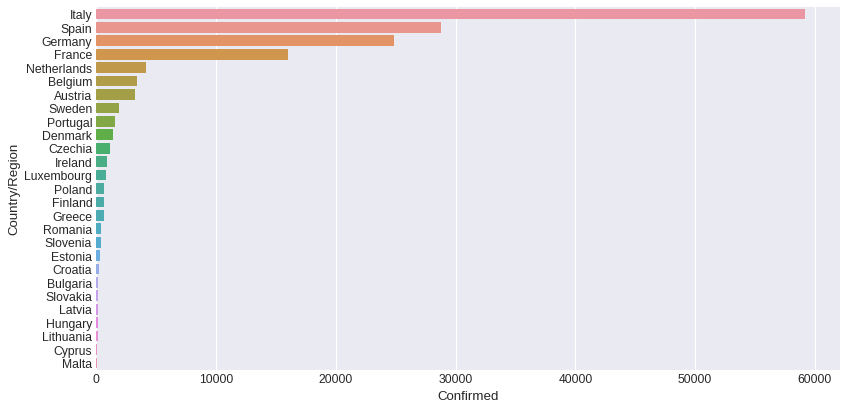

In [20]:
grid = sns.barplot(y="Country/Region", x="Confirmed", data=eu_data_df)

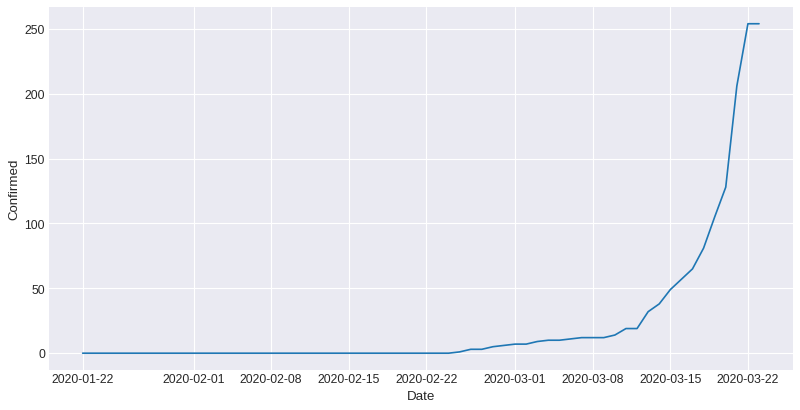

In [21]:
grid = sns.lineplot(data=all_data_df[(all_data_df["Country/Region"] == 'Croatia')], x="Date", y="Confirmed")

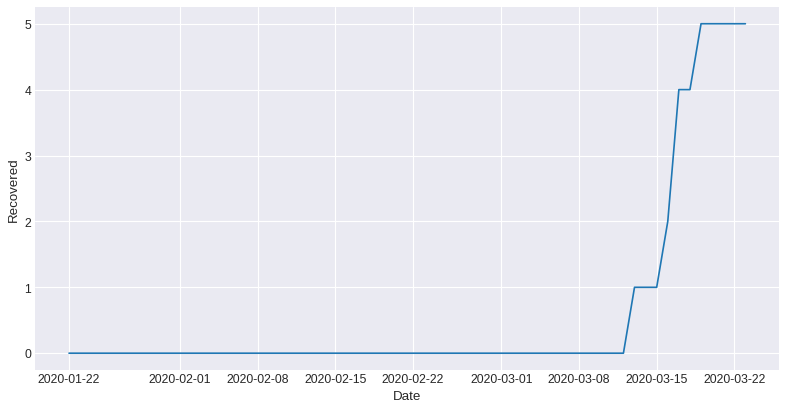

In [22]:
grid = sns.lineplot(data=all_data_df[(all_data_df["Country/Region"] == 'Croatia')], x="Date", y="Recovered")

In [23]:
# Slovenia and Hungary are bordering Croatia in north, Bosnia and Herzegovina, and Serbia in east, it has a short border with Montenegro, and it shares maritime borders with Italy.
croatia_bordering_countried = ['Croatia', 'Slovenia', 'Hungary', 'Serbia', 'Montenegro', 'Italy', 'Bosnia and Herzegovina']
croatia_bordering_countried_no_it = ['Croatia', 'Slovenia', 'Hungary', 'Serbia', 'Montenegro', 'Bosnia and Herzegovina']

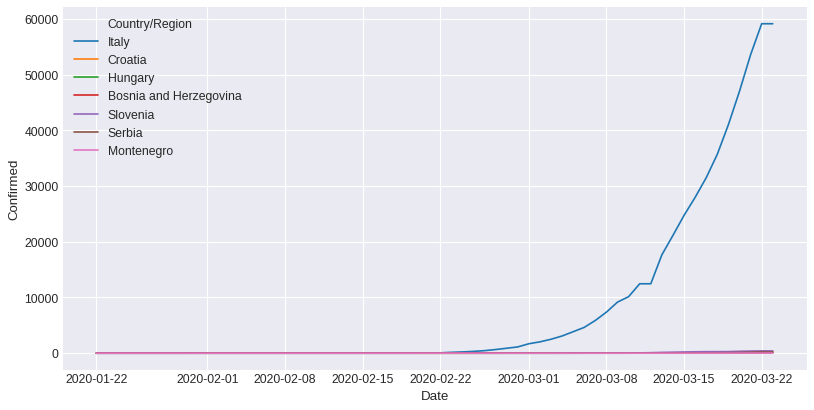

In [24]:
grid = sns.lineplot(data=all_data_df[(all_data_df["Country/Region"].isin(croatia_bordering_countried))], x="Date", y="Confirmed", hue="Country/Region")

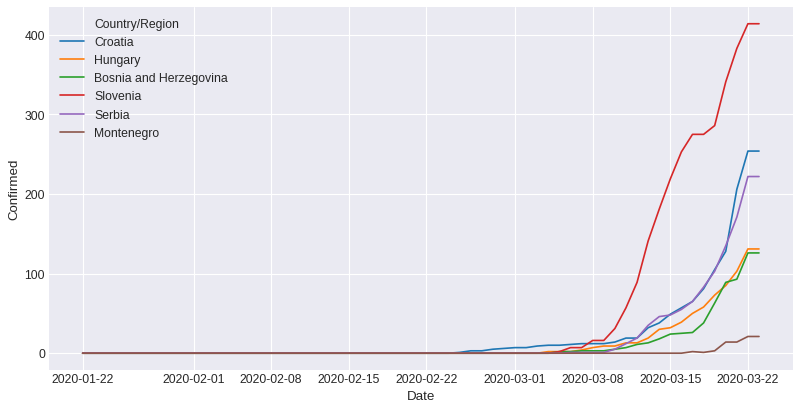

In [25]:
grid = sns.lineplot(data=all_data_df[(all_data_df["Country/Region"].isin(croatia_bordering_countried_no_it))], x="Date", y="Confirmed", hue="Country/Region")

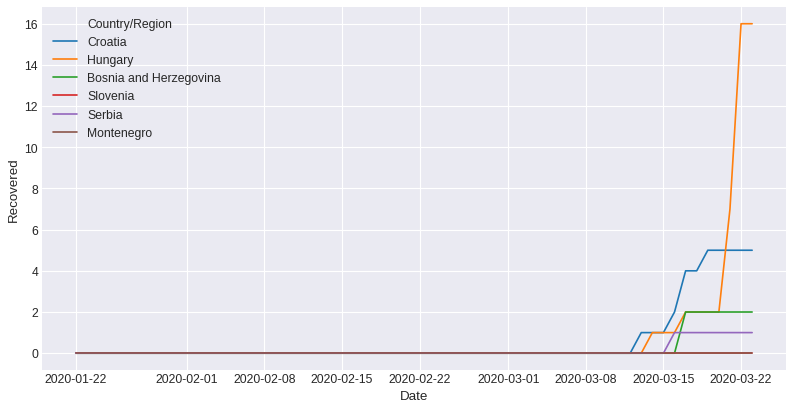

In [26]:
grid = sns.lineplot(data=all_data_df[(all_data_df["Country/Region"].isin(croatia_bordering_countried_no_it))], x="Date", y="Recovered", hue="Country/Region")

In [27]:
import datetime

all_data_df['DateWeek'] = all_data_df['Date'].apply(lambda date_row: date_row.isocalendar()[1])
all_data_df['DayOfYear'] = all_data_df['Date'].apply(lambda date_row: date_row.timetuple().tm_yday)

In [28]:
(all_data_df[(all_data_df["Country/Region"] == 'Croatia')].groupby(['DateWeek']).max()).reset_index()

,DateWeek,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,DayOfYear
0,4,NaN,Croatia,45.1,15.2,2020-01-26,0.0,0.0,0.0,26
1,5,NaN,Croatia,45.1,15.2,2020-02-02,0.0,0.0,0.0,33
2,6,NaN,Croatia,45.1,15.2,2020-02-09,0.0,0.0,0.0,40
3,7,NaN,Croatia,45.1,15.2,2020-02-16,0.0,0.0,0.0,47
4,8,NaN,Croatia,45.1,15.2,2020-02-23,0.0,0.0,0.0,54
5,9,NaN,Croatia,45.1,15.2,2020-03-01,7.0,0.0,0.0,61
6,10,NaN,Croatia,45.1,15.2,2020-03-08,12.0,0.0,0.0,68
7,11,NaN,Croatia,45.1,15.2,2020-03-15,49.0,0.0,1.0,75
8,12,NaN,Croatia,45.1,15.2,2020-03-22,254.0,1.0,5.0,82
9,13,NaN,Croatia,45.1,15.2,2020-03-23,254.0,1.0,5.0,83


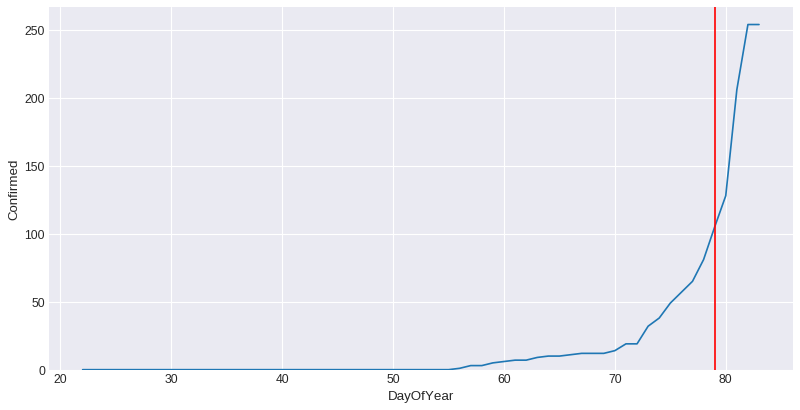

In [29]:
g = sns.lineplot(data=(all_data_df[(all_data_df["Country/Region"] == 'Croatia')].groupby(['DayOfYear']).max()).reset_index(), x="DayOfYear", y="Confirmed")
g.set(ylim=(0, None))

# Day of quarantine
plt.axvline(datetime.datetime(2020, 3, 19).timetuple().tm_yday, 0, 1, color='red')

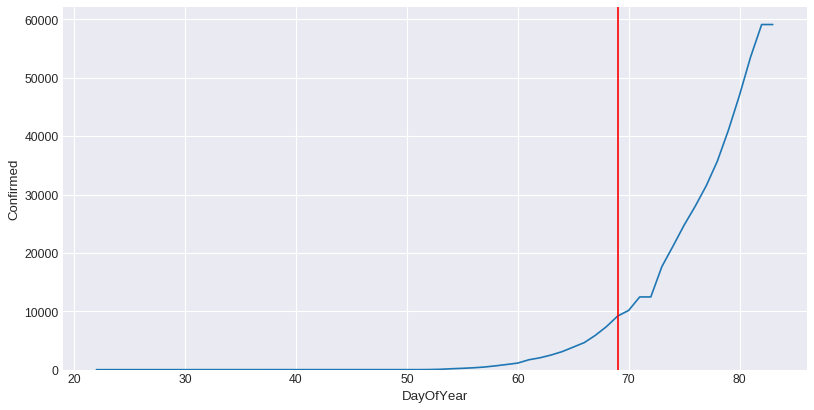

In [30]:
g = sns.lineplot(data=(all_data_df[(all_data_df["Country/Region"] == 'Italy')].groupby(['DayOfYear']).max()).reset_index(), x="DayOfYear", y="Confirmed")
g.set(ylim=(0, None))

# Day of quarantine
#plt.axvline(datetime.datetime(2020, 2, 21).timetuple().tm_yday, 0, 1, color='red')
plt.axvline(datetime.datetime(2020, 3, 9).timetuple().tm_yday, 0, 1, color='red')

[(30, 61.5)]

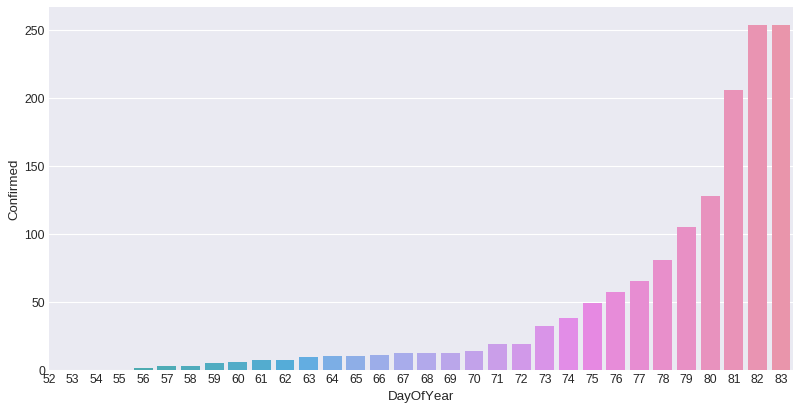

In [31]:
g = sns.barplot(data=(all_data_df[(all_data_df["Country/Region"] == 'Croatia')].groupby(['DayOfYear']).max()).reset_index(), x="DayOfYear", y="Confirmed")
g.set(ylim=(0, None))
g.set(xlim=(30, None))

[(30, 61.5)]

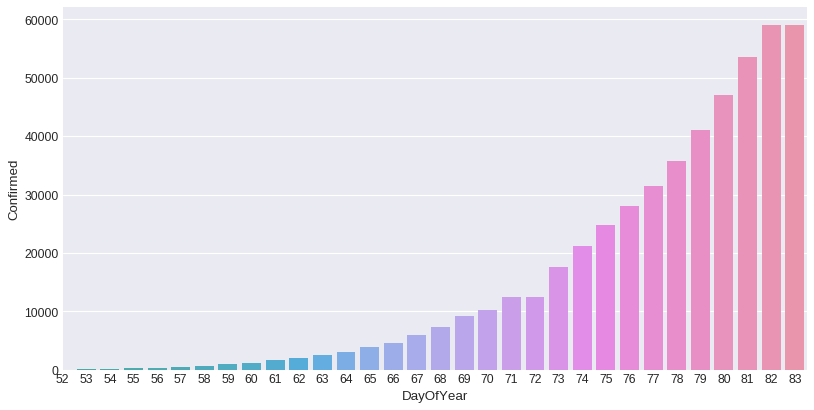

In [32]:
g = sns.barplot(data=(all_data_df[(all_data_df["Country/Region"] == 'Italy')].groupby(['DayOfYear']).max()).reset_index(), x="DayOfYear", y="Confirmed")
g.set(ylim=(0, None))
g.set(xlim=(30, None))

In [33]:
cro_data_df = all_data_df[(all_data_df["Country/Region"].isin(croatia_bordering_countried))].sort_values('Confirmed')
#cro_data_df = all_data_df[(all_data_df["Confirmed"] < 100) & (data["Country/Region"].isin(croatia_bordering_countried))].sort_values('Confirmed')

In [34]:
cro_data_df

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,DateWeek,DayOfYear
16,NaN,Italy,43.0000,12.0000,2020-01-22,0.0,0.0,0.0,4,22
13101,NaN,Bosnia and Herzegovina,43.9159,17.6791,2020-02-17,0.0,0.0,0.0,8,48
13102,NaN,Slovenia,46.1512,14.9955,2020-02-17,0.0,0.0,0.0,8,48
13109,NaN,Serbia,44.0165,21.0059,2020-02-17,0.0,0.0,0.0,8,48
13478,NaN,Montenegro,42.5000,19.3000,2020-02-17,0.0,0.0,0.0,8,48
...,...,...,...,...,...,...,...,...,...,...
28573,NaN,Italy,43.0000,12.0000,2020-03-19,41035.0,3405.0,4440.0,12,79
29074,NaN,Italy,43.0000,12.0000,2020-03-20,47021.0,4032.0,4440.0,12,80
29575,NaN,Italy,43.0000,12.0000,2020-03-21,53578.0,4825.0,6072.0,12,81
30076,NaN,Italy,43.0000,12.0000,2020-03-22,59138.0,5476.0,7024.0,12,82


In [35]:
# The assumption is that the latest day is the one containing the biggest numbers which is a valid assumption
cro_data_df.groupby("Country/Region").max().reset_index().sort_values('Confirmed')

,Country/Region,Province/State,Lat,Long,Date,Confirmed,Deaths,Recovered,DateWeek,DayOfYear
4,Montenegro,NaN,42.5000,19.3000,2020-03-23,21.0,0.0,0.0,13,83
0,Bosnia and Herzegovina,NaN,43.9159,17.6791,2020-03-23,126.0,1.0,2.0,13,83
2,Hungary,NaN,47.1625,19.5033,2020-03-23,131.0,6.0,16.0,13,83
5,Serbia,NaN,44.0165,21.0059,2020-03-23,222.0,2.0,1.0,13,83
1,Croatia,NaN,45.1000,15.2000,2020-03-23,254.0,1.0,5.0,13,83
6,Slovenia,NaN,46.1512,14.9955,2020-03-23,414.0,2.0,0.0,13,83
3,Italy,NaN,43.0000,12.0000,2020-03-23,59138.0,5476.0,7024.0,13,83


In [36]:
cro_data_df[(cro_data_df["Confirmed"] > 30)].sort_values('Confirmed')

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,DateWeek,DayOfYear
24124,NaN,Slovenia,46.1512,14.9955,2020-03-10,31.0,0.0,0.0,11,70
25581,NaN,Croatia,45.1000,15.2000,2020-03-13,32.0,0.0,1.0,11,73
26623,NaN,Hungary,47.1625,19.5033,2020-03-15,32.0,1.0,1.0,11,75
25634,NaN,Serbia,44.0165,21.0059,2020-03-13,35.0,0.0,0.0,11,73
28131,NaN,Bosnia and Herzegovina,43.9159,17.6791,2020-03-18,38.0,0.0,2.0,12,78
...,...,...,...,...,...,...,...,...,...,...
28573,NaN,Italy,43.0000,12.0000,2020-03-19,41035.0,3405.0,4440.0,12,79
29074,NaN,Italy,43.0000,12.0000,2020-03-20,47021.0,4032.0,4440.0,12,80
29575,NaN,Italy,43.0000,12.0000,2020-03-21,53578.0,4825.0,6072.0,12,81
30076,NaN,Italy,43.0000,12.0000,2020-03-22,59138.0,5476.0,7024.0,12,82


In [37]:
# Preparing data for geoplot:
timeline_data_df = all_data_df.copy()
timeline_data_df.loc[:, 'Scaled Confirmed'] = timeline_data_df.loc[:, 'Confirmed'].apply(lambda s: np.log(s))
timeline_data_df.loc[:, 'Scaled Confirmed'] = timeline_data_df.loc[:, 'Scaled Confirmed'].apply(lambda s: 0 if s == -np.inf else s)

In [38]:
timeline_data_df["DateStr"] = timeline_data_df["Date"].astype(str)

## Regression, China

In [39]:
all_data_df[(all_data_df["Country/Region"] == 'China')].groupby('Province/State').max().sort_values('Confirmed')

,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,DateWeek,DayOfYear
Province/State,,,,,,,,,
Tibet,China,31.6927,88.0924,2020-03-23,1.0,0.0,1.0,13,83
Qinghai,China,35.7452,95.9956,2020-03-23,18.0,0.0,18.0,13,83
Macau,China,22.1667,113.5500,2020-03-23,24.0,0.0,10.0,13,83
Ningxia,China,37.2692,106.1655,2020-03-23,75.0,0.0,75.0,13,83
Inner Mongolia,China,44.0935,113.9448,2020-03-23,75.0,1.0,74.0,13,83
Xinjiang,China,41.1129,85.2401,2020-03-23,76.0,3.0,73.0,13,83
Jilin,China,43.6661,126.1923,2020-03-23,93.0,1.0,92.0,13,83
Liaoning,China,41.2956,122.6085,2020-03-23,127.0,2.0,124.0,13,83
Shanxi,China,37.5777,112.2922,2020-03-23,133.0,0.0,133.0,13,83


In [40]:
sns.set_context("notebook")

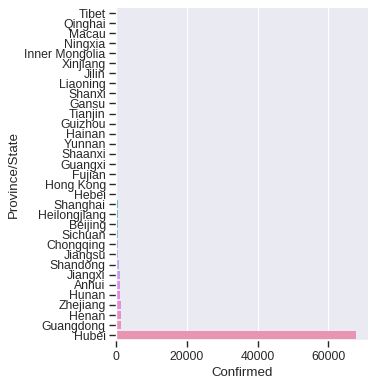

In [41]:
g = sns.catplot(data=all_data_df[(all_data_df["Country/Region"] == 'China')].groupby('Province/State').max().sort_values('Confirmed').reset_index(), kind="bar", x="Confirmed", y="Province/State", orient='h')

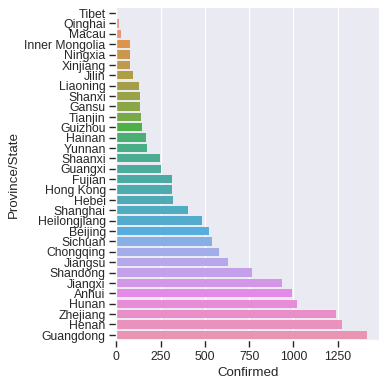

In [42]:
g = sns.catplot(data=all_data_df[(all_data_df["Country/Region"] == 'China') & (all_data_df["Province/State"] != 'Hubei')].groupby('Province/State').max().sort_values('Confirmed').reset_index(), kind="bar", x="Confirmed", y="Province/State", orient='h')

In [43]:
all_data_df['Date'].min()
all_data_df['Date'].max()

datetime.date(2020, 3, 23)

In [44]:
all_data_df[(all_data_df["Country/Region"] == 'China') & (all_data_df['Province/State'] == 'Hubei')].sort_values('Confirmed')

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,DateWeek,DayOfYear
154,Hubei,China,30.9756,112.2707,2020-01-22,444.0,17.0,28.0,4,22
655,Hubei,China,30.9756,112.2707,2020-01-23,444.0,17.0,28.0,4,23
1156,Hubei,China,30.9756,112.2707,2020-01-24,549.0,24.0,31.0,4,24
1657,Hubei,China,30.9756,112.2707,2020-01-25,761.0,40.0,32.0,4,25
2158,Hubei,China,30.9756,112.2707,2020-01-26,1058.0,52.0,42.0,4,26
...,...,...,...,...,...,...,...,...,...,...
28711,Hubei,China,30.9756,112.2707,2020-03-19,67800.0,3130.0,57682.0,12,79
29212,Hubei,China,30.9756,112.2707,2020-03-20,67800.0,3133.0,58382.0,12,80
29713,Hubei,China,30.9756,112.2707,2020-03-21,67800.0,3139.0,58946.0,12,81
30214,Hubei,China,30.9756,112.2707,2020-03-22,67800.0,3144.0,59433.0,12,82


In [45]:
# Preparing data for geoplot:
timeline_data = all_data_df.copy()
timeline_data.loc[:, 'Scaled Confirmed'] = timeline_data.loc[:, 'Confirmed'].apply(lambda s: np.log(s))
timeline_data.loc[:, 'Scaled Confirmed'] = timeline_data.loc[:, 'Scaled Confirmed'].apply(lambda s: 0 if s == -np.inf else s)

In [46]:
timeline_data["Date"] = timeline_data["Date"].astype(str)

In [47]:
fig = go.Figure(data=go.Scattergeo(
        lon = timeline_data['Long'],
        lat = timeline_data['Lat'],
        text = timeline_data['Country/Region'] + ', ' + timeline_data['Province/State'],

        mode = 'markers',
        marker = dict(
            size = timeline_data["Scaled Confirmed"],
            opacity = 0.8,
            reversescale = False,
            autocolorscale = False,
            symbol = 'square',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
            colorscale = 'inferno',
            cmin = 0,
            color = timeline_data["Scaled Confirmed"],
            #cmax = timeline_data['Scaled Confirmed'].max(),
            colorbar_title="Asia status"
        )

        ))

fig.update_layout(
    title = 'Asia status',
    geo_scope='asia',

)
fig.show()

In [48]:
fig = px.scatter_geo(timeline_data[(timeline_data["Country/Region"] == 'China')], lat="Lat", lon="Long",
                     color="Confirmed", # which column to use to set the color of markers
                     hover_data=['Province/State'], # column added to hover information
                     size="Scaled Confirmed", # size of markers
                     projection="natural earth")

fig.update_layout(
        title = 'Spread of the virus for Asia, focus on China',
        geo_scope='asia',
    )
fig.show()

In [49]:
# Plotting geoplot:
fig = px.scatter_geo(timeline_data[(timeline_data["Country/Region"] == 'China')], lat="Lat", lon="Long", size="Scaled Confirmed", opacity=0.7,hover_name = "Country/Region",animation_frame="Date", color="Confirmed",hover_data=['Confirmed'], projection="natural earth")

fig.update_layout(
        title = 'Spread of the virus for Asia, focus on China',
        geo_scope='asia',
    )
fig.show()

## Focus on specific province

### Hubei

Text(0.5, 1.0, 'Hubei confirmed cases')

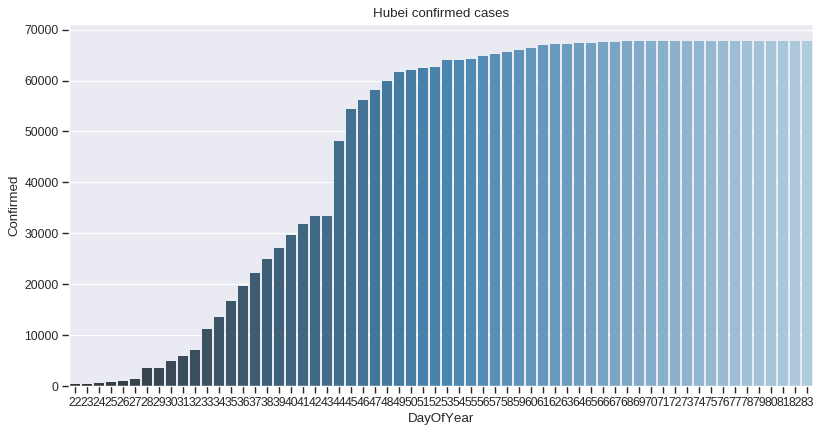

In [50]:
china_hubei_df = all_data_df[(all_data_df["Country/Region"] == 'China') & (all_data_df['Province/State'] == 'Hubei')]

ax = sns.barplot(data=china_hubei_df, x="DayOfYear", y="Confirmed", ci="sd", palette="Blues_d")
ax.set_title('Hubei confirmed cases')

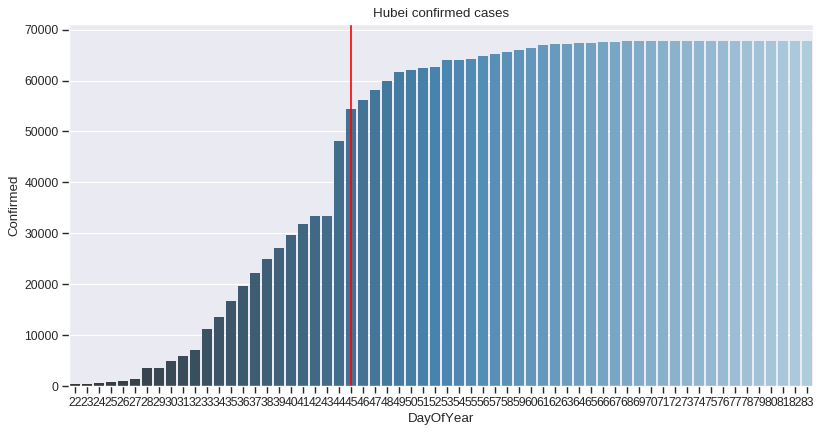

In [51]:
china_hubei_df = all_data_df[(all_data_df["Country/Region"] == 'China') & (all_data_df['Province/State'] == 'Hubei')]

ax = sns.barplot(data=china_hubei_df, x="DayOfYear", y="Confirmed", ci="sd", palette="Blues_d")
ax.set_title('Hubei confirmed cases')

plt.axvline(datetime.datetime(2020, 1, 23).timetuple().tm_yday, 0, 1, color='red')

## Guangdong

Text(0.5, 1.0, 'Guangdong confirmed cases')

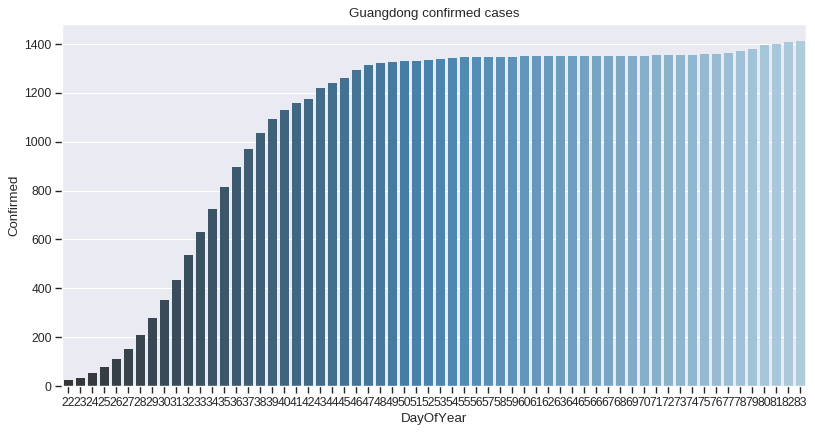

In [52]:
china_guangdong_df = all_data_df[(all_data_df["Country/Region"] == 'China') & (all_data_df['Province/State'] == 'Guangdong')]

ax = sns.barplot(data=china_guangdong_df, x="DayOfYear", y="Confirmed", ci="sd", palette="Blues_d")
ax.set_title('Guangdong confirmed cases')

## Henan

Text(0.5, 1.0, 'Henan confirmed cases')

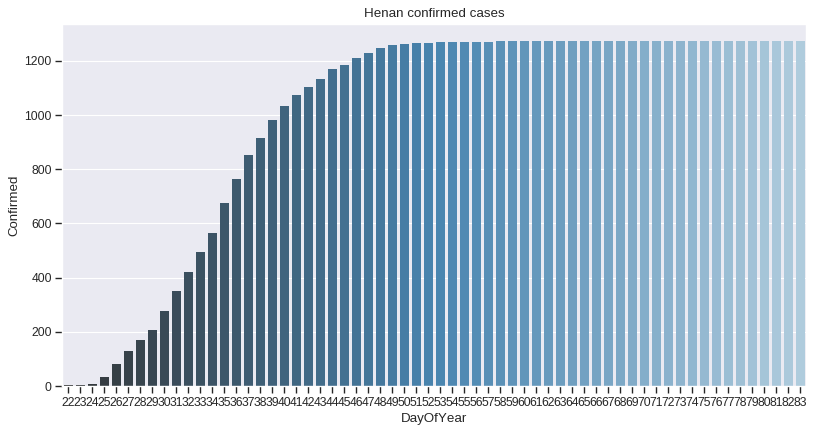

In [53]:
china_henan_df = all_data_df[(all_data_df["Country/Region"] == 'China') & (all_data_df['Province/State'] == 'Henan')]

ax = sns.barplot(data=china_henan_df, x="DayOfYear", y="Confirmed", ci="sd", palette="Blues_d")
ax.set_title('Henan confirmed cases')

## Zhejiang

Text(0.5, 1.0, 'Henan confirmed cases')

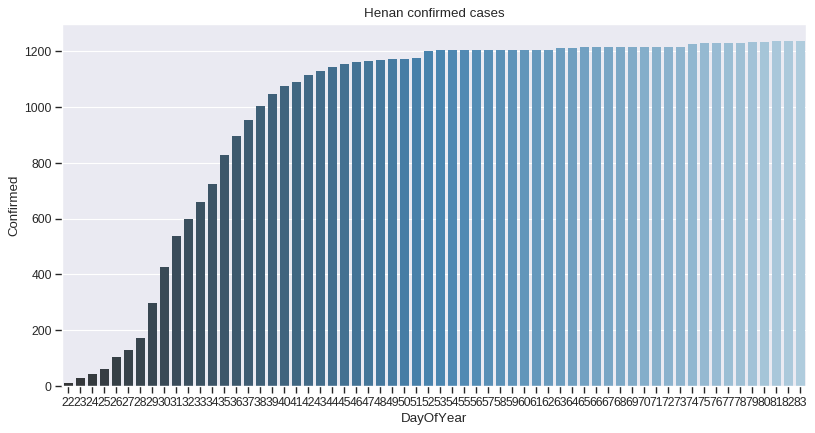

In [54]:
china_zhejiang_df = all_data_df[(all_data_df["Country/Region"] == 'China') & (all_data_df['Province/State'] == 'Zhejiang')]

ax = sns.barplot(data=china_zhejiang_df, x="DayOfYear", y="Confirmed", ci="sd", palette="Blues_d")
ax.set_title('Henan confirmed cases')

## Logistic curve

In [55]:
import numpy, scipy
from scipy.optimize import curve_fit
import warnings

np.set_printoptions(suppress=True)

In [56]:
def show_logistic_regression(x_data, y_data, title='Data projection'):

    def logistic_equation(x, a, b, c):
        return a / (1.0 + np.power(x / b, c))

    fitted_parameters, pcov = curve_fit(logistic_equation, x_data, y_data, np.array([1.0, 1.0, 1.0]))

    model_predictions = logistic_equation(x_data, *fitted_parameters) 

    absolute_error = model_predictions - y_data

    squared_error = np.square(absolute_error)
    mean_squared_error = np.mean(squared_error)
    root_mean_squared_error = np.sqrt(mean_squared_error)
    r_squared = 1.0 - (np.var(absolute_error) / np.var(y_data))

    print('Parameters:', fitted_parameters)
    print('RMSE:', root_mean_squared_error)
    print('R-squared:', r_squared)

    print()


    def scatter_plot():
        f = plt.figure(figsize=(16,10), dpi=100)
        axes = f.add_subplot(111)

        # Plot the actual data
        axes.plot(x_data, y_data, 'X')

        # Create model data
        x_model = numpy.linspace(min(x_data), max(x_data) + 40)
        y_model = logistic_equation(x_model, *fitted_parameters)

        # Plot model data
        axes.plot(x_model, y_model)

        axes.set_xlabel('Days in year')
        axes.set_ylabel('Confirmed cases')

        axes.set_title(title)

        axes.axvline(datetime.date.today().timetuple().tm_yday, 0, 1, color='red', linewidth=4)
        axes.axhline(fitted_parameters[0], 0, 1, color='blue', linewidth=4)


    scatter_plot()

## China

Parameters: [68402.16250208    40.51474408    -9.29058621]
RMSE: 2147.3738620148993
R-squared: 0.9931986882029319



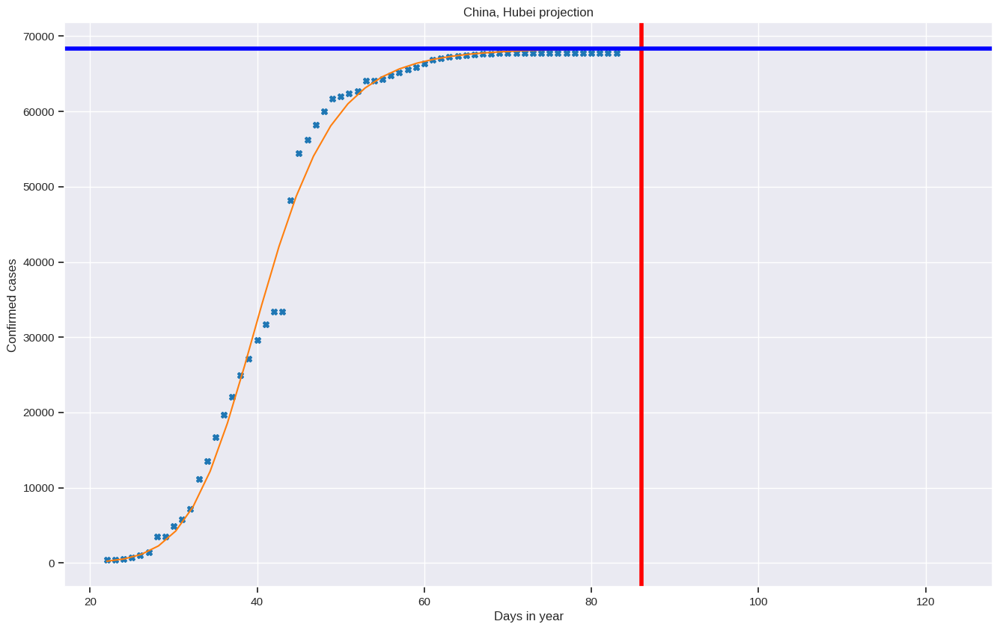

In [57]:
fit_data_df = china_hubei_df

x_data = fit_data_df['DayOfYear'].values
y_data = fit_data_df['Confirmed'].values

show_logistic_regression(x_data, y_data, title='China, Hubei projection')

If you need to check this for some reason.

Parameters: [1363.54062665   33.6206197    -9.1457048 ]
RMSE: 13.475436473239217
R-squared: 0.9990719678808355



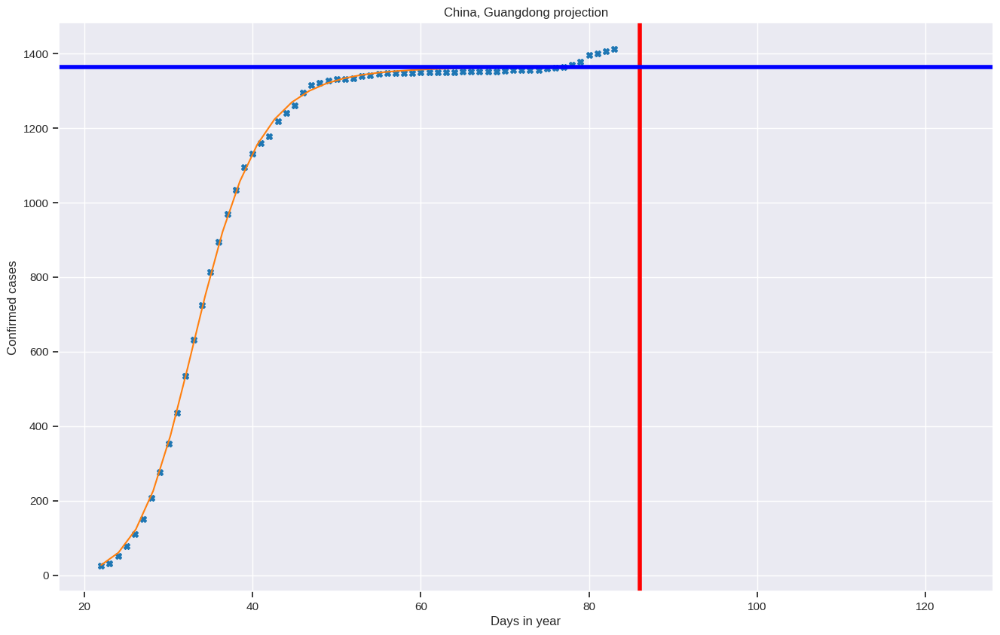

In [58]:
fit_data_df = china_guangdong_df

x_data = fit_data_df['DayOfYear'].values
y_data = fit_data_df['Confirmed'].values

show_logistic_regression(x_data, y_data, title='China, Guangdong projection')

Parameters: [1278.841463    34.5120609   -9.6757844]
RMSE: 10.359774247987332
R-squared: 0.9994257490665336



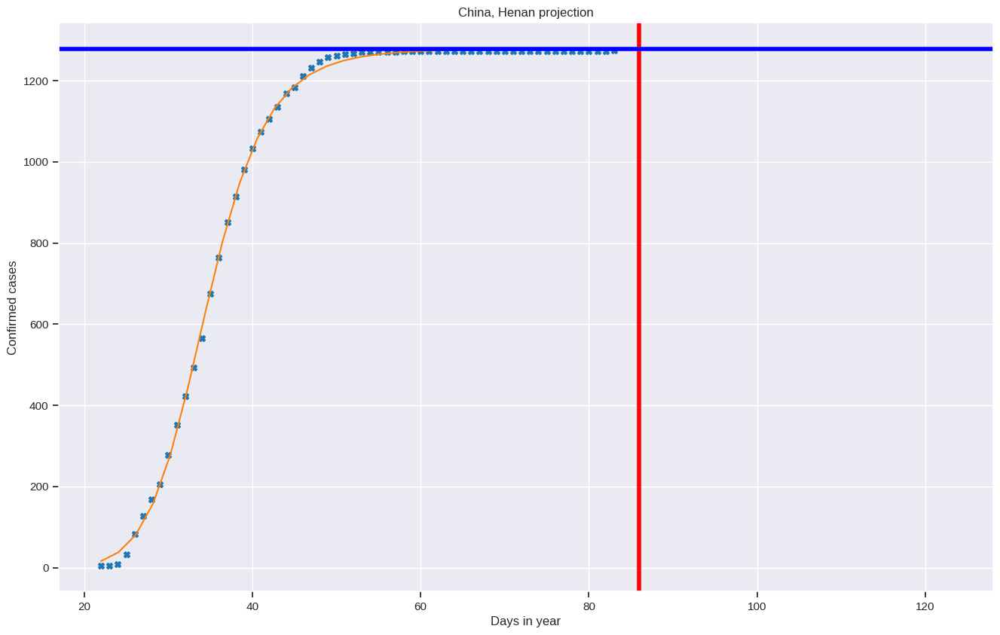

In [59]:
fit_data_df = china_henan_df

x_data = fit_data_df['DayOfYear'].values
y_data = fit_data_df['Confirmed'].values

show_logistic_regression(x_data, y_data, title='China, Henan projection')

Parameters: [1214.0292241    32.41472947   -9.89271996]
RMSE: 18.665950135442394
R-squared: 0.9976625774300207



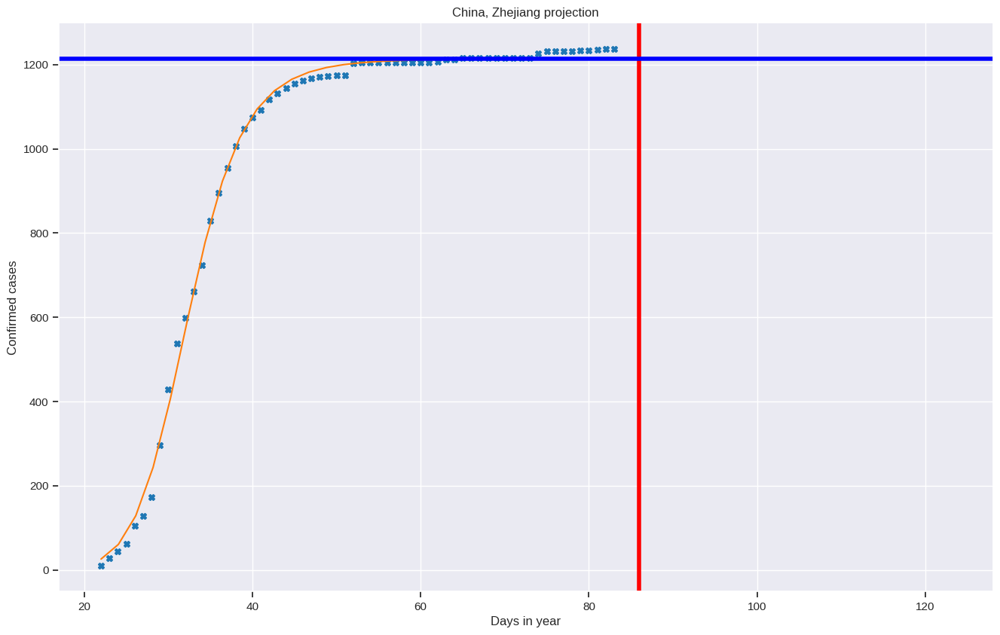

In [60]:
fit_data_df = china_zhejiang_df

x_data = fit_data_df['DayOfYear'].values
y_data = fit_data_df['Confirmed'].values

show_logistic_regression(x_data, y_data, title='China, Zhejiang projection')

## Europe

## Italy

Text(0.5, 1.0, 'Italy confirmed cases')

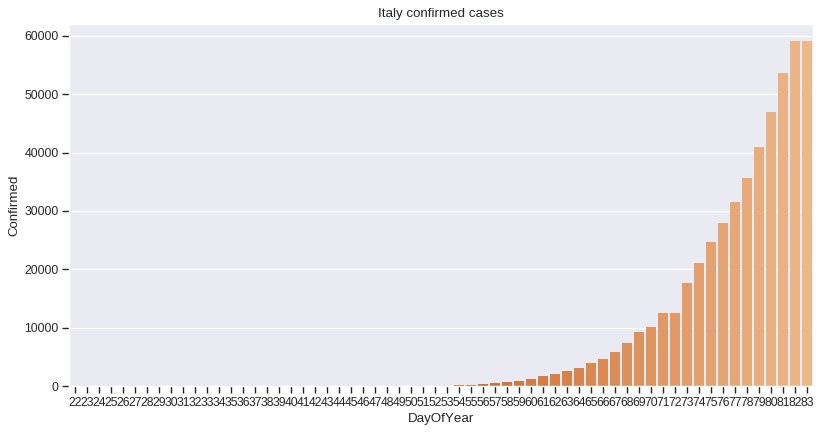

In [61]:
italy_df = all_data_df[(all_data_df["Country/Region"] == 'Italy')]

ax = sns.barplot(data=italy_df, x="DayOfYear", y="Confirmed", ci="sd", palette="Oranges_d")
ax.set_title('Italy confirmed cases')

Parameters: [112765.47460041     81.92175747    -14.71321238]
RMSE: 643.718631942607
R-squared: 0.9982680494476839



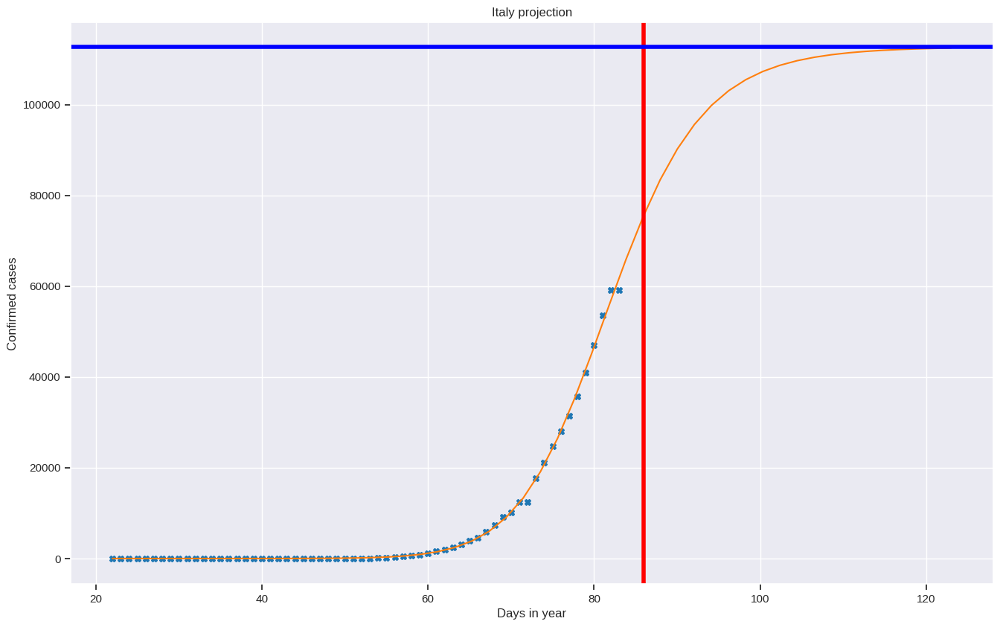

In [62]:
fit_data_df = italy_df

x_data = fit_data_df['DayOfYear'].values
y_data = fit_data_df['Confirmed'].values

show_logistic_regression(x_data, y_data, title='Italy projection')

## Spain

Text(0.5, 1.0, 'Spain confirmed cases')

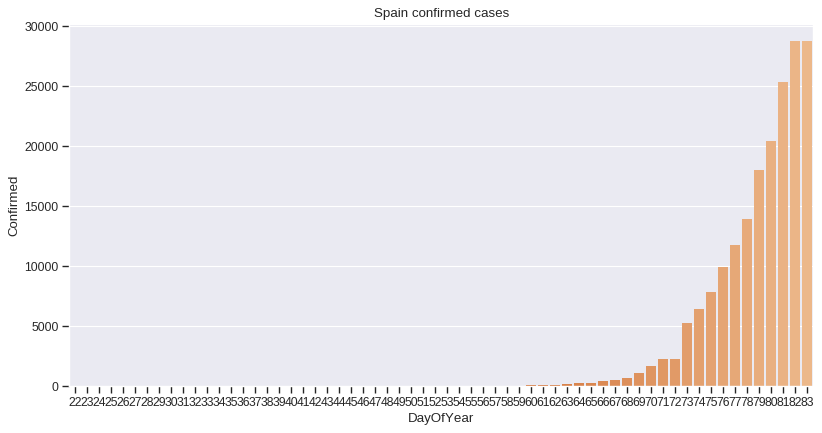

In [63]:
spain_df = all_data_df[(all_data_df["Country/Region"] == 'Spain')]

ax = sns.barplot(data=spain_df, x="DayOfYear", y="Confirmed", ci="sd", palette="Oranges_d")
ax.set_title('Spain confirmed cases')

Parameters: [42924.09950541    80.08912519   -23.68877791]
RMSE: 383.61022735012523
R-squared: 0.9970125927580161



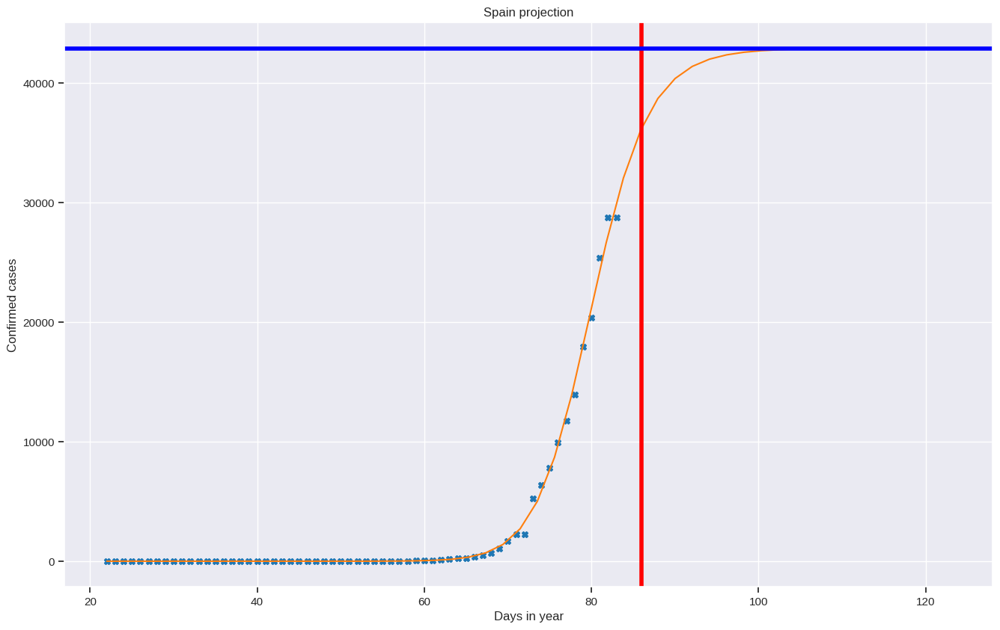

In [64]:
fit_data_df = spain_df

x_data = fit_data_df['DayOfYear'].values
y_data = fit_data_df['Confirmed'].values

show_logistic_regression(x_data, y_data, title='Spain projection')

## Germany

Text(0.5, 1.0, 'Germany confirmed cases')

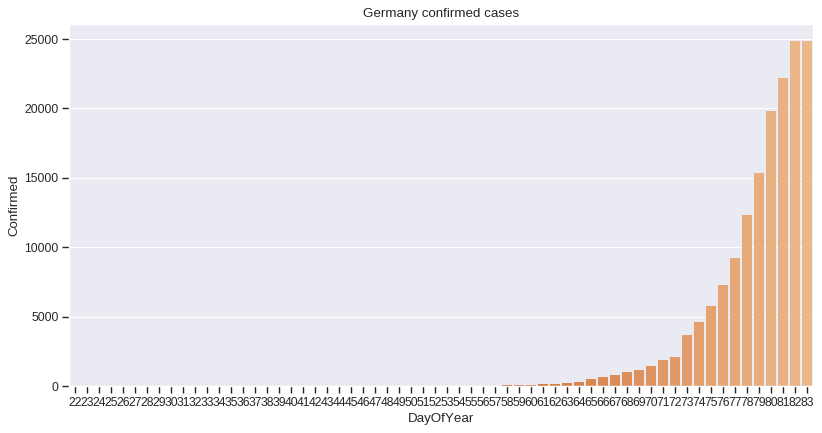

In [65]:
germany_df = all_data_df[(all_data_df["Country/Region"] == 'Germany')]

ax = sns.barplot(data=germany_df, x="DayOfYear", y="Confirmed", ci="sd", palette="Oranges_d")
ax.set_title('Germany confirmed cases')

Parameters: [34020.52817915    79.42400197   -27.45731895]
RMSE: 359.8721156601175
R-squared: 0.9966424447915753



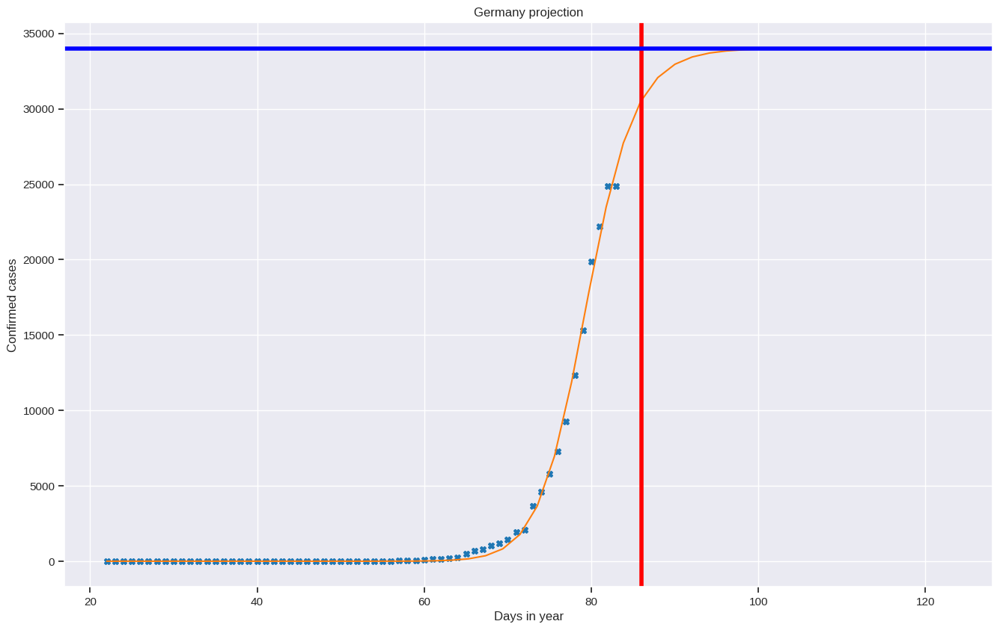

In [66]:
fit_data_df = germany_df

x_data = fit_data_df['DayOfYear'].values
y_data = fit_data_df['Confirmed'].values

show_logistic_regression(x_data, y_data, title='Germany projection')

## France

In [67]:
#france_df.groupby('Province/State').max().reset_index()

Text(0.5, 1.0, 'France confirmed cases')

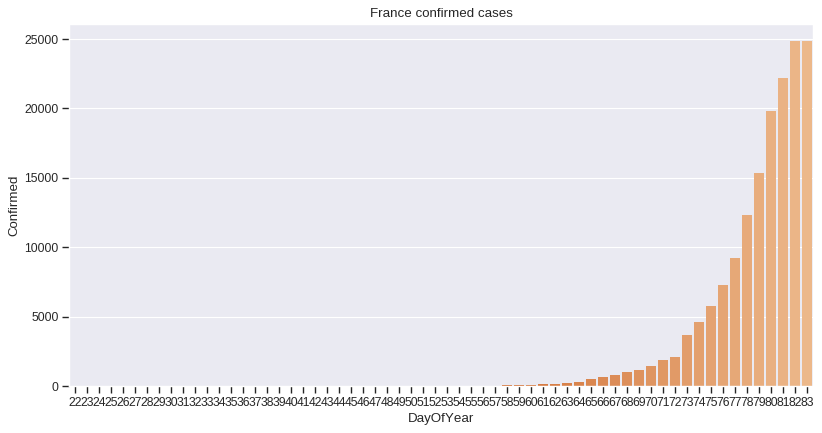

In [68]:
# Let's just group this together for now
france_df = all_data_df[(all_data_df["Country/Region"] == 'France') & (all_data_df["Province/State"] == 'France')]

ax = sns.barplot(data=germany_df, x="DayOfYear", y="Confirmed", ci="sd", palette="Oranges_d")
ax.set_title('France confirmed cases')

Parameters: [24531.97169031    79.9168059    -20.28220721]
RMSE: 196.7747874480813
R-squared: 0.9976777898390544



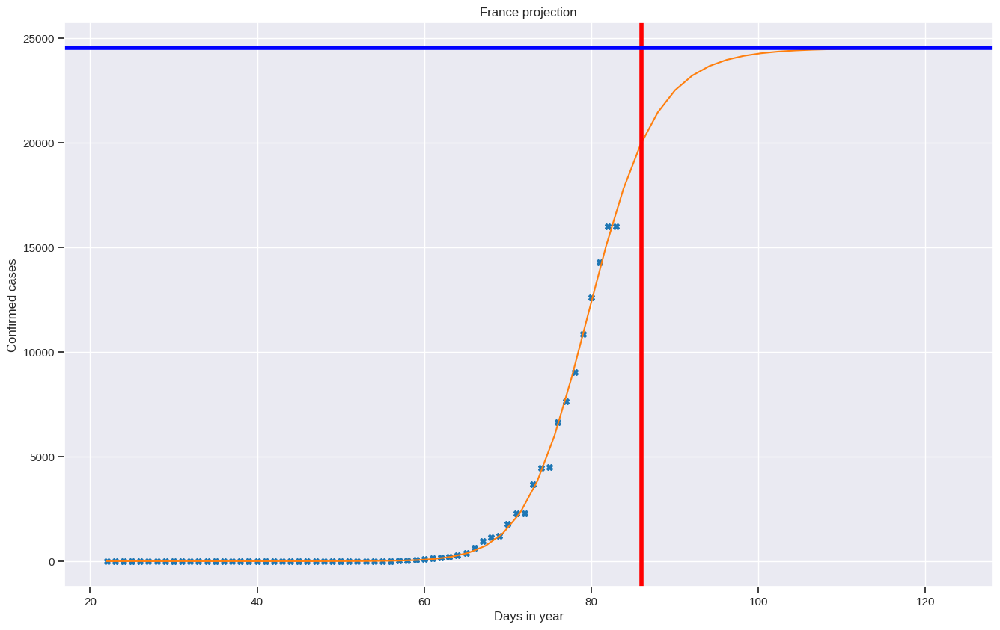

In [69]:
fit_data_df = france_df

x_data = fit_data_df['DayOfYear'].values
y_data = fit_data_df['Confirmed'].values

show_logistic_regression(x_data, y_data, title='France projection')

## Normal distribution

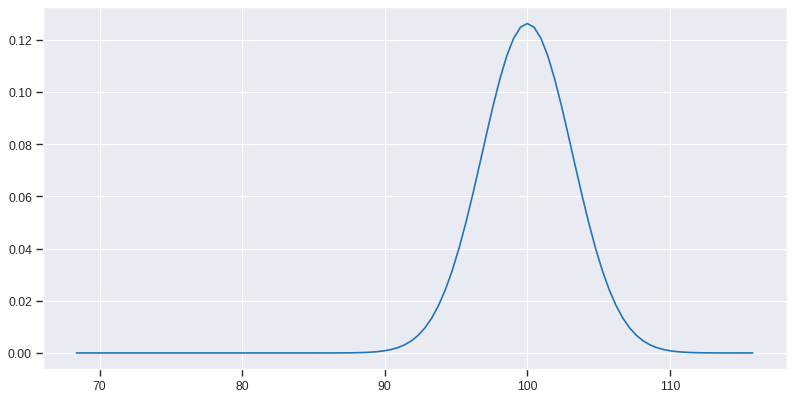

In [70]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats
import math

mu = 100
variance = 10
sigma = math.sqrt(variance)

test_x = np.linspace(mu - 10*sigma, mu + 5*sigma, 100)
test_y = stats.norm.pdf(test_x, mu, sigma)

plt.plot(test_x, test_y)
plt.show()

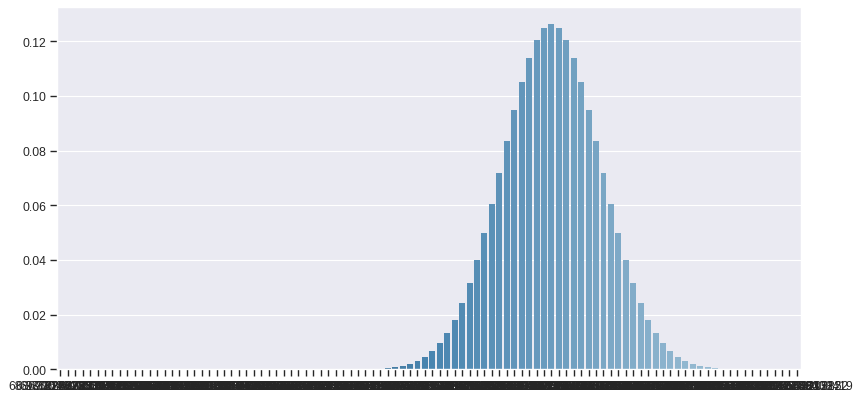

In [71]:
sns.barplot(x=test_x, y=test_y, palette="Blues_d")

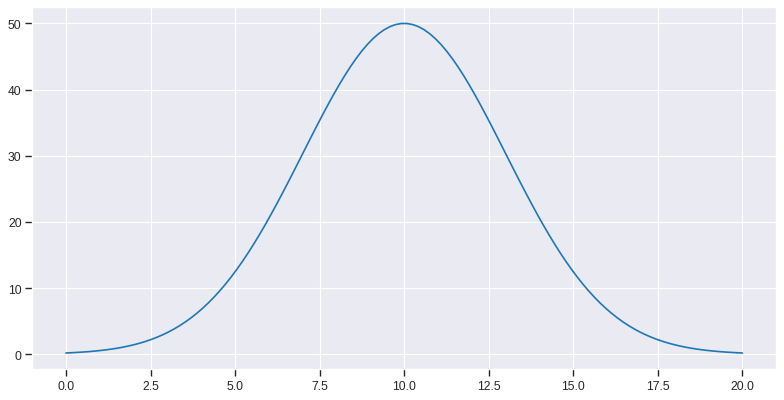

In [72]:
import numpy as np

def gaussian(x, size, mu, sig):
    return size * np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

x_values = np.linspace(0, 20, 120)
y_values = gaussian(x_values, 50, 10, 3)
#for mu, sig in [(-1, 1), (0, 2), (2, 3)]:
#    mp.plot(x_values, gaussian(x_values, 50, mu, sig))

plt.plot(x_values, y_values)
#plt.xlim(-5, 25)
plt.show()

In [73]:
def show_gaussian_regression(x_data, y_data, title='Data projection', params=np.array([1.0, 1.0, 1.0])):

    def gaussian_equation(x, size, mu, sig):
        return size * np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

    fitted_parameters, pcov = curve_fit(gaussian_equation, x_data, y_data, params)

    model_predictions = gaussian_equation(x_data, *fitted_parameters) 

    absolute_error = model_predictions - y_data

    squared_error = np.square(absolute_error)
    mean_squared_error = np.mean(squared_error)
    root_mean_squared_error = np.sqrt(mean_squared_error)
    r_squared = 1.0 - (np.var(absolute_error) / np.var(y_data))

    print('Parameters:', fitted_parameters)
    print('RMSE:', root_mean_squared_error)
    print('R-squared:', r_squared)

    print()


    def scatter_plot():
        f = plt.figure(figsize=(16,10), dpi=100)
        axes = f.add_subplot(111)

        # Plot the actual data
        axes.plot(x_data, y_data, 'X')

        # Create model data
        x_model = numpy.linspace(min(x_data), max(x_data) + 20)
        y_model = gaussian_equation(x_model, *fitted_parameters)

        # Plot model data
        axes.plot(x_model, y_model)

        axes.set_xlabel('Days in year')
        axes.set_ylabel('Confirmed cases')

        axes.set_title(title)

        #axes.axhline(fitted_parameters[0], 0, 1, color='blue', linewidth=4)


    scatter_plot()

Parameters: [50. 10.  3.]
RMSE: 0.0
R-squared: 1.0



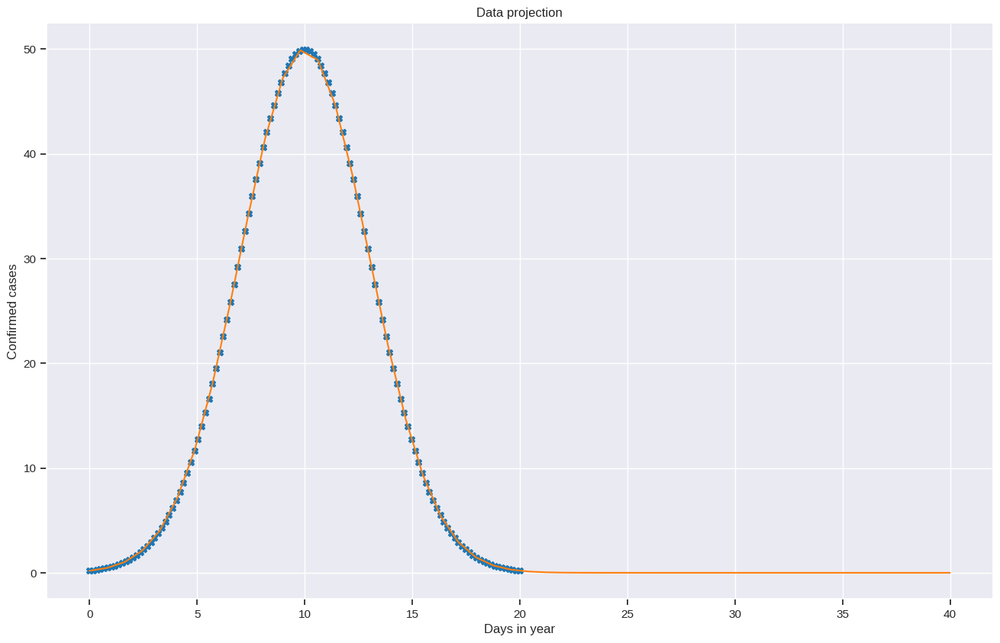

In [74]:
show_gaussian_regression(x_values, y_values)

## Growth factors and PyMC3

In [75]:
import pymc3 as pm
print('Running on PyMC3 v{}'.format(pm.__version__))

Running on PyMC3 v3.8


/home/ksaric/anaconda3/envs/covid-analysis/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/ksaric/anaconda3/envs/covid-analysis/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



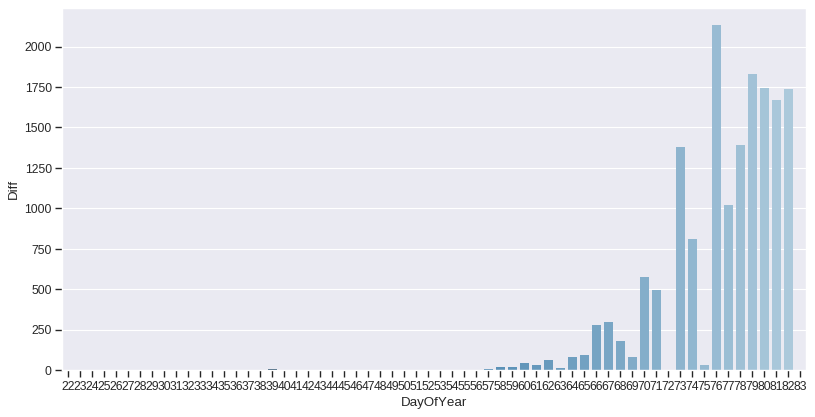

In [76]:
#fit_df = spain_df
#fit_df = china_henan_df
fit_df = france_df
#fit_df = germany_df

#fit_df = all_data_df[(all_data_df["Country/Region"] == 'Croatia')]

fit_df['Diff'] = fit_df['Confirmed'].diff()
fit_df['GrowthFactor'] = fit_df['Diff'] / fit_df['Diff'].shift(-1)

sns.barplot(data=fit_df, x="DayOfYear", y="Diff", palette="Blues_d")

In [77]:
x = fit_df['DayOfYear'].fillna(0).values
y = fit_df['Diff'].fillna(0).values
#y = fit_df['Confirmed'].fillna(0).values

#x = test_x
#y = test_y

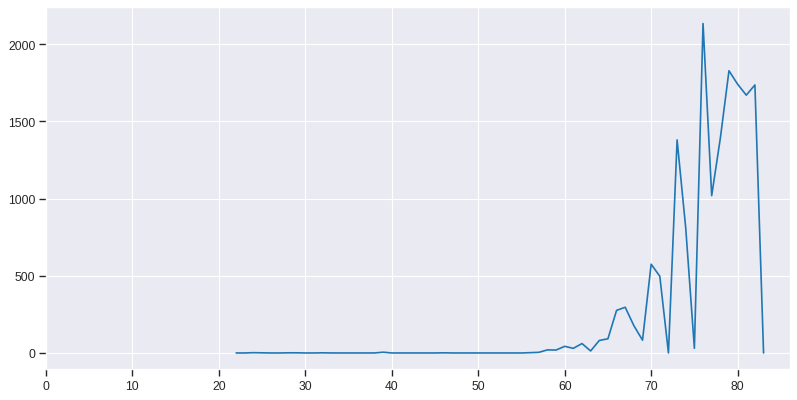

In [78]:
plt.plot(x, y)
plt.xlim(0, None)
plt.show()

Parameters: [-0.05951921 34.99969907  1.00133737]
RMSE: 609.9014463992196
R-squared: 4.078584990296896e-06



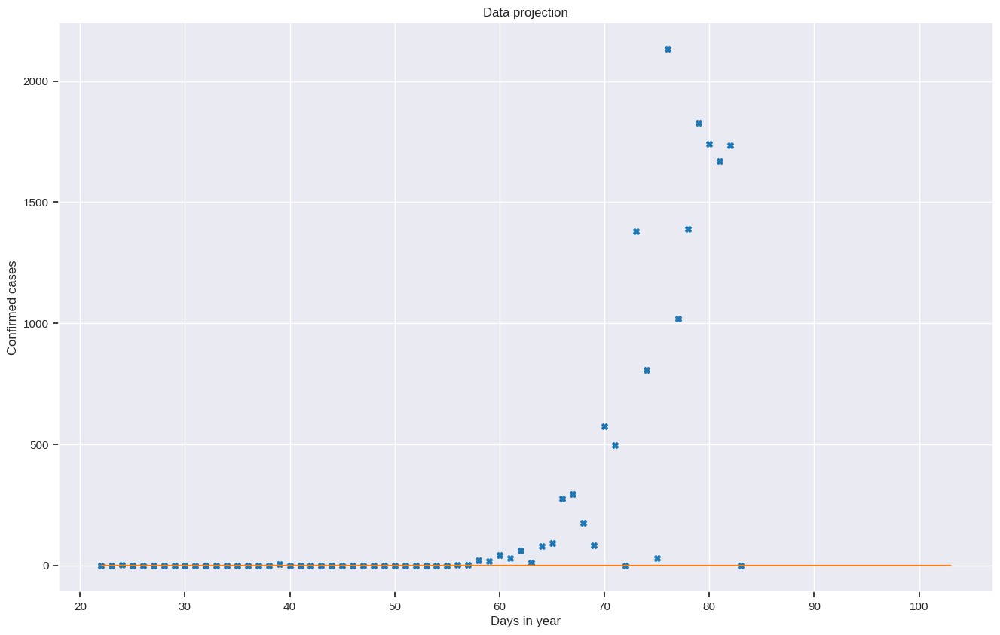

In [79]:
show_gaussian_regression(x, y, params=np.array([100.0, 35.0, 1.0]))

## Gaussian processes

* https://towardsdatascience.com/understanding-gaussian-process-the-socratic-way-ba02369d804
* https://juanitorduz.github.io/reg_bayesian_regression/

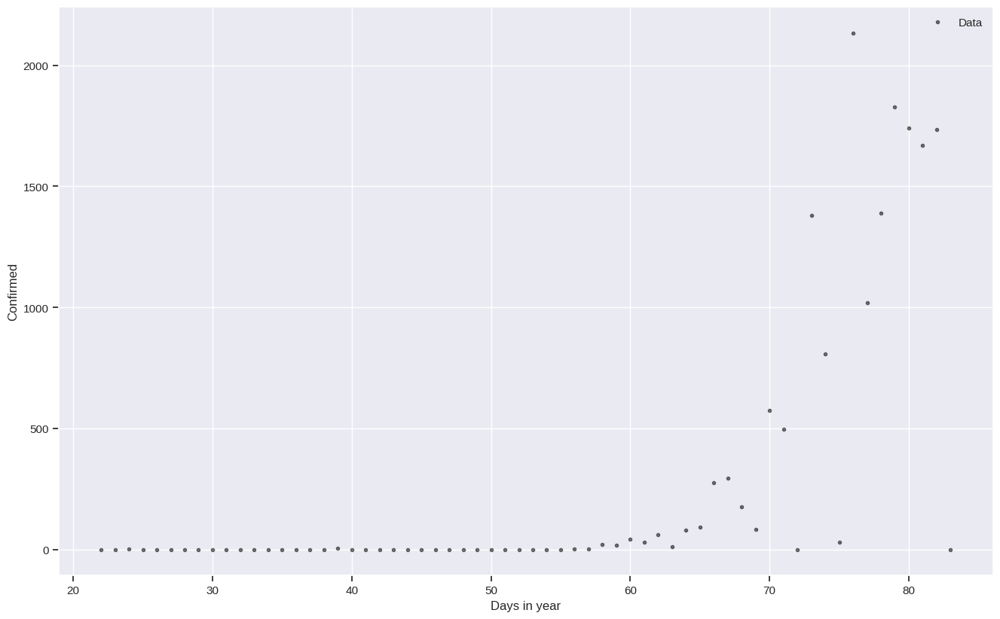

In [80]:
n = len(x) # The number of data points
X = x[:, None] # The inputs to the GP, they must be arranged as a column vector

## Plot the data and the unobserved latent function
fig = plt.figure(figsize=(16,10), dpi=100)
ax = fig.gca()

ax.plot(X, y, 'ok', ms=3, alpha=0.5, label="Data")
ax.set_xlabel("Days in year")
ax.set_ylabel("Confirmed");
plt.legend()

In [81]:
with pm.Model() as model:
    ℓ = pm.Gamma("ℓ", alpha=2, beta=1)
    η = pm.HalfCauchy("η", beta=5)

    cov = η**2 * pm.gp.cov.Exponential(1, ℓ)
    gp = pm.gp.Marginal(cov_func=cov)

    σ = pm.HalfCauchy("σ", beta=5)
    y_ = gp.marginal_likelihood("y", X=X, y=y, noise=σ)

    mp = pm.find_MAP()

/home/ksaric/anaconda3/envs/covid-analysis/lib/python3.7/site-packages/theano/tensor/basic.py:6611: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.

/home/ksaric/anaconda3/envs/covid-analysis/lib/python3.7/site-packages/theano/tensor/basic.py:6611: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.

/home/ksaric/anaconda3/envs/covid-analysis/lib/python3.7/site-packages/theano/tensor/basic.py:6611: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this 

In [82]:
# new values, we convert into column vector
X_new = np.linspace(max(x), 120, 40)[:,None]

# add the GP conditional to the model, given the new X values
with model:
    f_pred = gp.conditional("f_pred", X_new)

# To use the MAP values, you can just replace the trace with a length-1 list with `mp`
with model:
    pred_samples = pm.sample_posterior_predictive([mp], vars=[f_pred], samples=1000)

/home/ksaric/anaconda3/envs/covid-analysis/lib/python3.7/site-packages/theano/tensor/basic.py:6611: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.

  0%|          | 0/1000 [00:00<?, ?it/s]/home/ksaric/anaconda3/envs/covid-analysis/lib/python3.7/site-packages/theano/tensor/basic.py:6611: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.

/home/ksaric/anaconda3/envs/covid-analysis/lib/python3.7/site-packages/theano/tensor/basic.py:6611: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` in

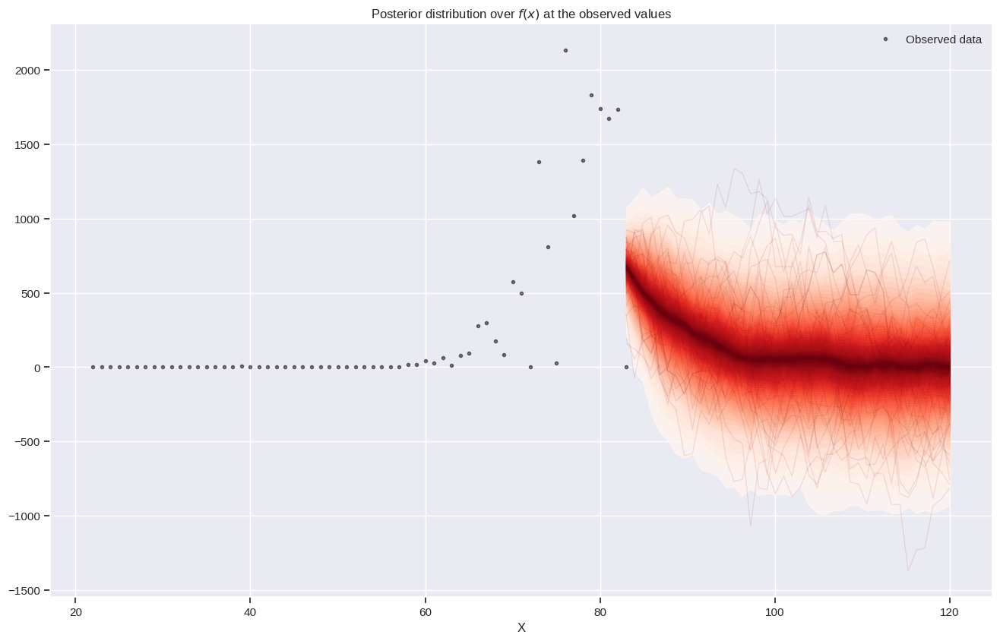

In [83]:
# plot the results
fig = plt.figure(figsize=(16,10), dpi=100)
ax = fig.gca()

# plot the samples from the gp posterior with samples and shading
from pymc3.gp.util import plot_gp_dist
plot_gp_dist(ax, pred_samples["f_pred"], X_new)

# plot the data and the true latent function
plt.plot(X, y, 'ok', ms=3, alpha=0.5, label="Observed data")

# axis labels and title
plt.xlabel("X")
plt.title("Posterior distribution over $f(x)$ at the observed values")
plt.legend()

/home/ksaric/anaconda3/envs/covid-analysis/lib/python3.7/site-packages/theano/tensor/basic.py:6611: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.

/home/ksaric/anaconda3/envs/covid-analysis/lib/python3.7/site-packages/theano/tensor/basic.py:6611: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.

/home/ksaric/anaconda3/envs/covid-analysis/lib/python3.7/site-packages/theano/tensor/basic.py:6611: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this 

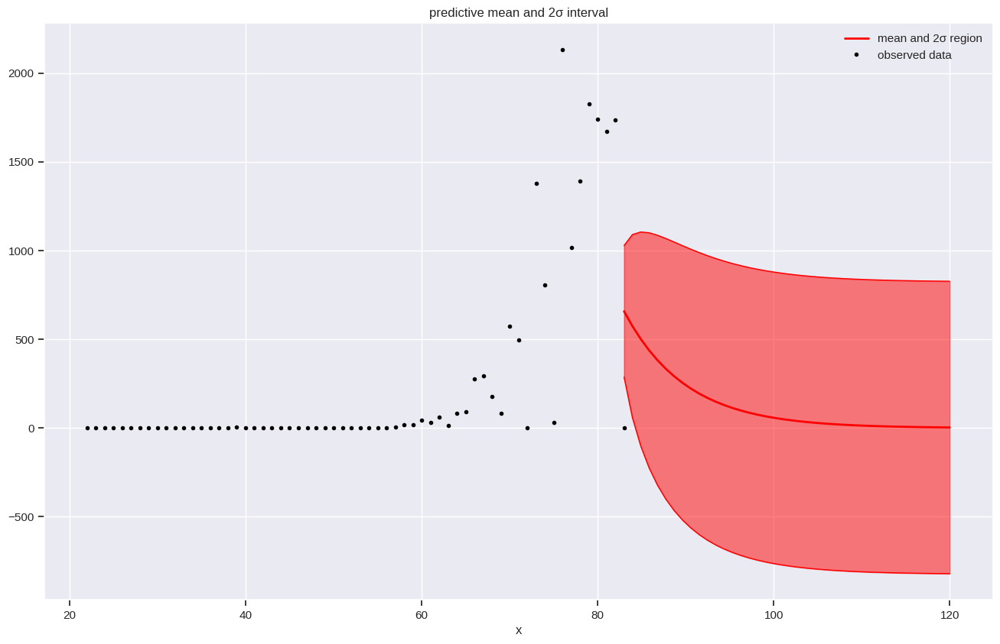

In [84]:
# predict
mu, var = gp.predict(X_new, point=mp, diag=True)
sd = np.sqrt(var)

# draw plot
fig = plt.figure(figsize=(16,10), dpi=100)
ax = fig.gca()

# plot mean and 2σ intervals
plt.plot(X_new, mu, 'r', lw=2, label="mean and 2σ region")
plt.plot(X_new, mu + 2*sd, 'r', lw=1)
plt.plot(X_new, mu - 2*sd, 'r', lw=1)
plt.fill_between(X_new.flatten(), mu - 2*sd, mu + 2*sd, color="r", alpha=0.5)

# plot original data and true function
plt.plot(X, y, 'ok', ms=3, alpha=1.0, label="observed data")

plt.xlabel("x")
plt.title("predictive mean and 2σ interval")
plt.legend()